# Kepler-51 planetary system in the light of the PhotoRing effect
## Reproducing the figures of Numpaque et al. (2026)

This notebook contains the code for reproducing the figures in the paper:

> S. Numpaque, J.I. Zuluaga, D. Kipping and J.A. Alvarado "Asterodensity profile analysis of the Kepler-51 planetary system:1
a case study on the detection of exoplanetary rings via the PhotoRing effect", in preparation.

For detailed explanations see the GitHub repository: [https://github.com/seap-udea/PRisma](https://github.com/seap-udea/PRisma).

## Preparing the environment

In [13]:
# ── Bootstrap: make the repository packages importable without installation ──
import sys, pathlib
_HERE = pathlib.Path.cwd()
_cands = [_HERE, *_HERE.parents]
_REPO = next((c for c in _cands if (c / "pipeline" / "photoring").is_dir() and (c / "pipeline" / "exorings").is_dir()), _HERE.parent)
for _p in (str(_REPO / "pipeline"), str(_REPO)):
    if _p not in sys.path:
        sys.path.insert(0, _p)
print("repo root:", _REPO)


repo root: /Users/jzuluaga/dev/PRisma


In [14]:
import numpy as np
import matplotlib.pyplot as plt
import warnings; warnings.filterwarnings("ignore")

import photoring as pr
import photoring.plotting as plot
from photoring import literature, contour
from photoring.io import load_observables, load_run

# The manuscript's look: saturated palette, LaTeX, 95% corner intervals.
plot.apply_style(plot.PAPER_STYLE)

# ── Select the system (paper name → pipeline case directory) ──────────────
SYSTEM = "kepler51"
CASE = {"kepler51": "kepler_51"}[SYSTEM]

paths = pr.CasePaths(CASE, pipeline_dir=_REPO / "pipeline")
RESULTS = paths.results_dir("exorings")
IMG = pathlib.Path(_REPO / "papers" / SYSTEM / "figures")
IMG.mkdir(parents=True, exist_ok=True)

print("SYSTEM:", SYSTEM)
print("CASE:  ", CASE)
print("results:", RESULTS)
print("figures:", IMG)


SYSTEM: kepler51
CASE:   kepler_51
results: /Users/jzuluaga/dev/PRisma/pipeline/kepler_51/results/exorings
figures: /Users/jzuluaga/dev/PRisma/papers/kepler51/figures


## 1. Configuration — the adopted runs

The manuscript's ring-geometry figures use the **fully free** model
($f_e,\ i_R,\ \theta,\ p,\ \tau,\ \rho_{\star,\rm true},\ b$ all sampled) with the likelihood
$\mathcal{L}_{\rm KDE} = (\delta,\ T_{14},\ \rho_{\star,\rm obs})$, nested sampling at
$N_{\rm live}=1200$ and $\Delta\ln Z = 0.01$, and $N_{\rm KDE}=5000$ training samples.

That combination was adopted because it is the only one in the retrieval suite that
reproduces the **full** set of transit observables — including the ones left out of the
likelihood. Simpler configurations fit their own likelihood observables but mispredict the
durations.

Runs are loaded from ``pipeline/<CASE>/results/exorings/``. Edit ``SYSTEM`` and
``RETRIEVAL_SETUP`` below to switch target / configuration.


In [15]:
# ── Select the retrieval setup (filename stem after "{CASE}_{planet}_") ───
# Available setups live under pipeline/<CASE>/results/exorings/*.npz
RETRIEVAL_SETUP = (
    "NS_exorings_kde_delta-T14-rho_obs_nlive1200_dlogz0.01"
    "_NKDE5000_seed2026_rhoFREE_bFREE_tauFREE_pFREE"
)
PLANETS = ["b", "d"]

print("RETRIEVAL_SETUP:")
print(" ", RETRIEVAL_SETUP)

runs = {}
npz_used = []
for pl in PLANETS:
    npz = RESULTS / f"{CASE}_{pl}_{RETRIEVAL_SETUP}.npz"
    npz_used.append(npz)
    if not npz.exists():
        print(f"MISSING: {npz}")
        continue
    runs[pl] = load_run(npz)
    r = runs[pl]
    print(f"planet {pl}: ndim={len(r['param_names'])}  lnZ={r['logz']:.3f}  "
          f"L_KDE={r['kde_obs']}  n={len(r['chain'])}")
    print(f"  <- {npz.name}")

ttv = {pl: load_observables(paths.observables_file(pl)) for pl in PLANETS}
rho_true_samples = np.loadtxt(paths.rho_true_samples) / 1000.0   # kg/m^3 -> g/cm^3
print("\nTTV observables loaded:", {k: len(v["delta"]) for k, v in ttv.items()})

RUN_VERSION = plot.run_version_id(npz_used)
print("RUN_VERSION:", RUN_VERSION)


RETRIEVAL_SETUP:
  NS_exorings_kde_delta-T14-rho_obs_nlive1200_dlogz0.01_NKDE5000_seed2026_rhoFREE_bFREE_tauFREE_pFREE
planet b: ndim=7  lnZ=2.002  L_KDE=['delta', 'T14', 'rho_obs']  n=16631
  <- kepler_51_b_NS_exorings_kde_delta-T14-rho_obs_nlive1200_dlogz0.01_NKDE5000_seed2026_rhoFREE_bFREE_tauFREE_pFREE.npz
planet d: ndim=7  lnZ=1.958  L_KDE=['delta', 'T14', 'rho_obs']  n=14994
  <- kepler_51_d_NS_exorings_kde_delta-T14-rho_obs_nlive1200_dlogz0.01_NKDE5000_seed2026_rhoFREE_bFREE_tauFREE_pFREE.npz

TTV observables loaded: {'b': 17756, 'd': 39002}
RUN_VERSION: 2026073023


## 6. Inferred ring geometries

**Manuscript figures:** `final_planetb_panel_.png`, `final_planetd_panel_.png`.

Per planet: the joint posterior over ring and nuisance parameters, with a sky-plane sketch of
the inferred ring system at the posterior medians inset in the corner plot's free upper-right
triangle. The black disk is the planet, the elliptical annulus the ring.

The corner is drawn by `dynesty` from the **weighted** nested-sampling output, and the titles
report its default 95% credible interval. What to read off it:

- **$f_e$** lands well inside its uniform prior at both edges — a genuine constraint, not a
  prior artefact — and far below the prograde stability bound near $0.5\,R_{\rm Hill}$. The
  values are comparable to Saturn's main rings, which reach $\approx 2.3\,R_{\rm Saturn}$.
- **The $f_e$–$p$ anti-correlation** is the most persistent feature of the whole retrieval
  suite. The effective occulting area is $A_{\rm eff} = \pi R_p^2 + A_{\rm ring}$, so any
  $(p, f_e)$ pair preserving $A_{\rm eff}$ gives an identical transit depth and the sampler
  explores that iso-depth surface freely.
- **$i_R$ and $\theta$** favour moderately inclined rings. Because the prior on $i_R$ is
  already $\propto \sin i_R$ (isotropic, hence edge-on-favouring), any departure *from the
  prior shape* measures the information the data actually contributed.
- **$b$ and $\rho_{\star,\rm true}$** are nuisance parameters, sampled here rather than fixed.
  Their posteriors sit in tension with the external constraints, which is why the manuscript
  reports these as model-conditional geometric solutions rather than as a revision of the
  system's orbital architecture or the star's properties.


In [16]:
# Corner / ring-panel figures come from photoring.plotting
# (plot_results_panel_inset, plot_results_panel_reduced_inset, …).


-> /Users/jzuluaga/dev/PRisma/papers/kepler51/figures/final_planetb_panel_.png
-> /Users/jzuluaga/dev/PRisma/papers/kepler51/figures/final_planetd_panel_.png


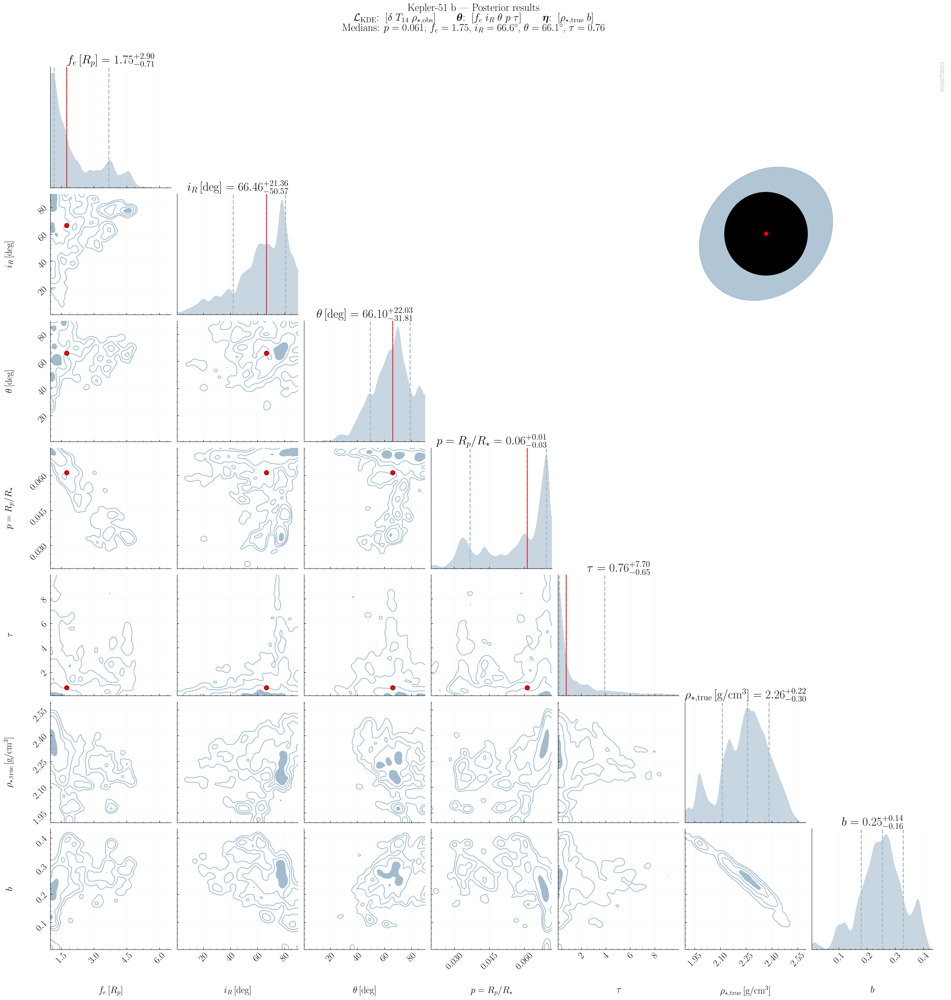

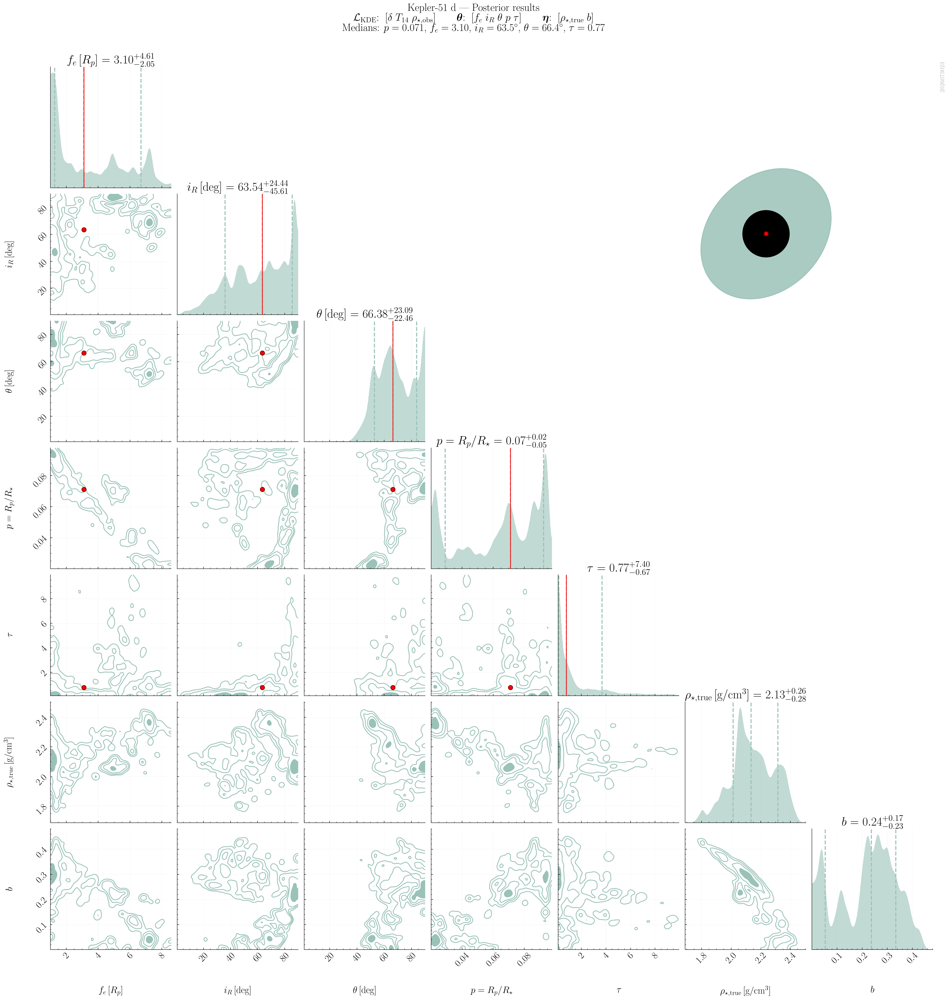

In [17]:
PANEL_NAME = {"b": "final_planetb_panel_.png", "d": "final_planetd_panel_.png"}

for pl, run in runs.items():
    fig = plot.plot_results_panel_inset(run)
    out = IMG / PANEL_NAME[pl]
    plot.add_run_version_label(fig, RUN_VERSION)
    fig.savefig(out, dpi=plot.STYLE["fig_dpi"], bbox_inches="tight")
    print("->", out)
    # plt.close(fig)


### Reduced Corner Plots
This section contains routines to plot the corner plots excluding nuisance parameters $\rho_{\star,\text{true}}$ and $b$.

In [18]:
# Reduced corner + ring inset: plot.plot_results_panel_reduced_inset


-> /Users/jzuluaga/dev/PRisma/papers/kepler51/figures/final_planetb_panel_reduced.png


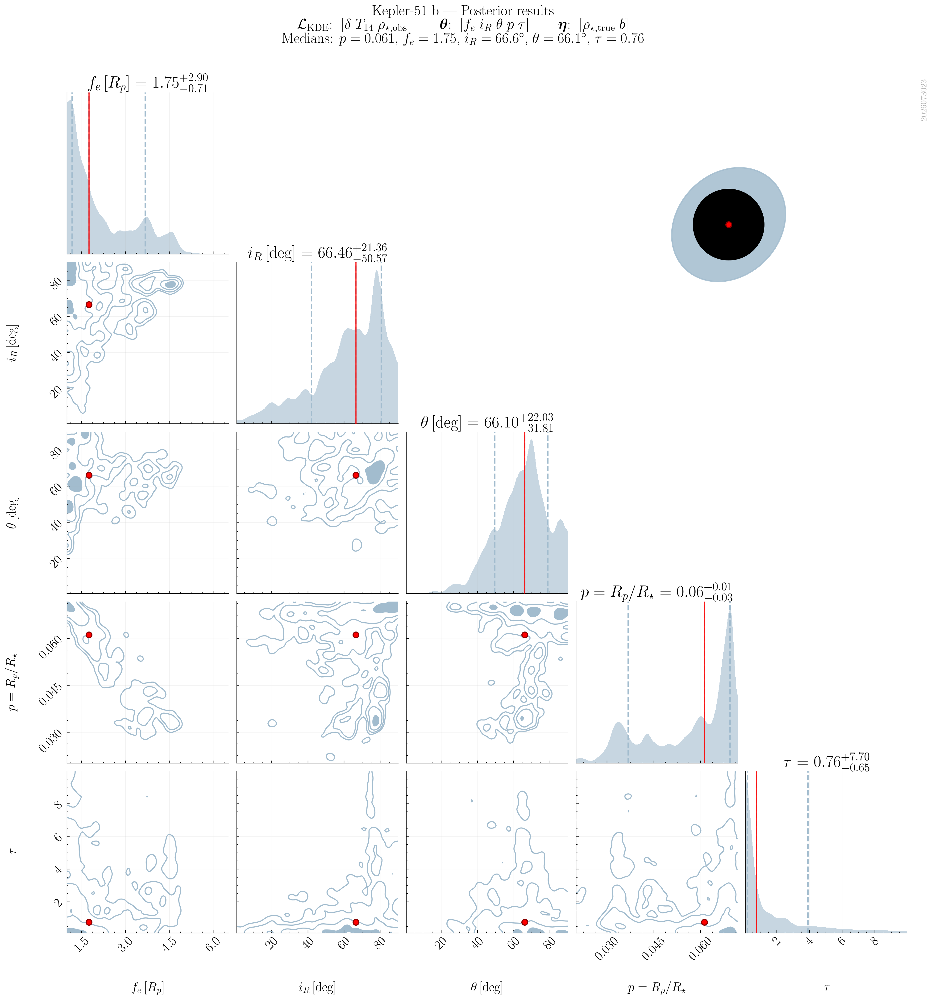

-> /Users/jzuluaga/dev/PRisma/papers/kepler51/figures/final_planetd_panel_reduced.png


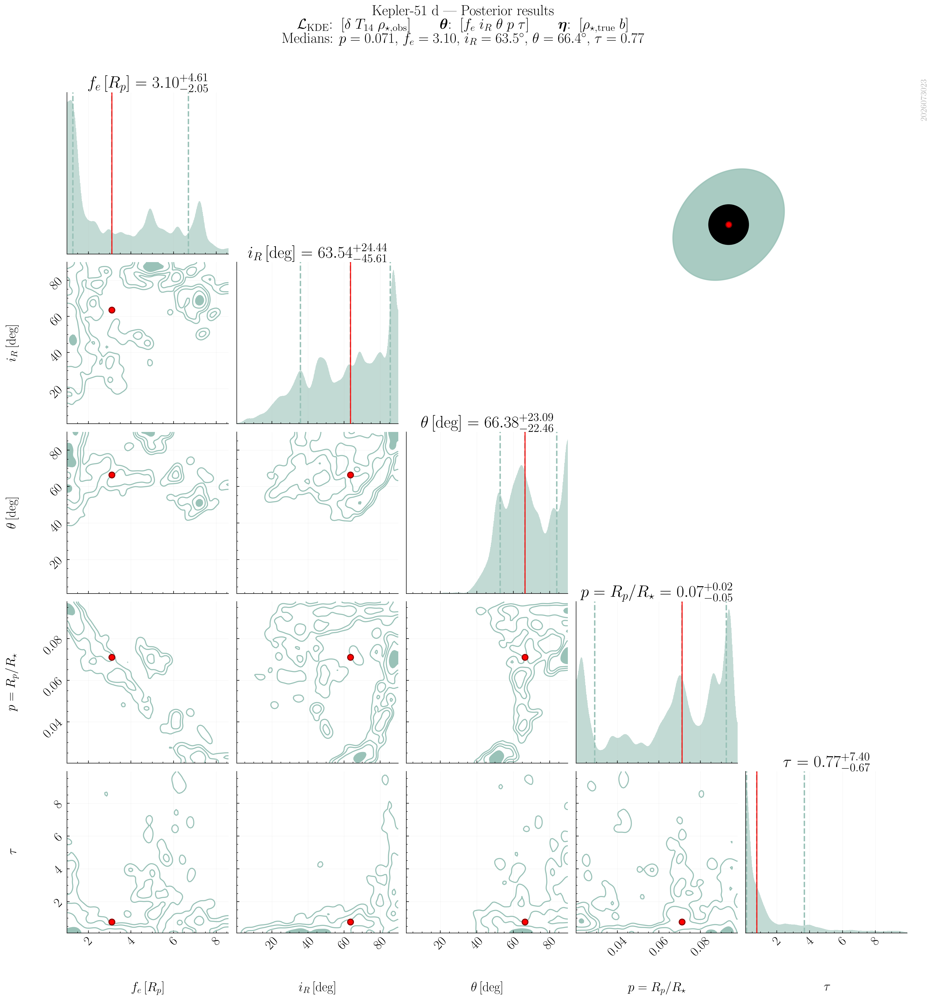

In [19]:
for pl in ["b", "d"]:
    fig_reduced = plot.plot_results_panel_reduced_inset(runs[pl], title=True)
    out_reduced = IMG / f"final_planet{pl}_panel_reduced.png"
    plot.add_run_version_label(fig_reduced, RUN_VERSION)
    fig_reduced.savefig(out_reduced, bbox_inches="tight", dpi=plot.STYLE["fig_dpi"])
    print("->", out_reduced)
    plt.show()
    #break


## High-resolution contours (same posterior)

Can you get finer corner contours by “increasing the number of samples”? **Partly — with an important caveat.**

The `.npz` already stores the full **weighted** nested-sampling cloud (`samples` + `logwt`). Drawing more points does **not** invent new posterior information: any larger equal-weight set is bootstrap resampling (with replacement) of that same cloud. Truly sharper constraints need a **new NS run** (higher `nlive`, tighter `dlogz`).

What *does* change how fine the contours *look* (dynesty `cornerplot`):

1. **`smooth` as a float** (paper default `0.02`) — Gaussian blur as a fraction of each axis span, with histogram bins ≈ `2/smooth`. Lower → sharper, more detailed contours.
2. **`smooth` as an int** — that many bins and **no** Gaussian blur (most “raw” look).
3. **Oversampling equal-weight draws** — when `smooth` is small, more draws reduce Monte Carlo noise in the 2-D histograms so contours look less jagged from undersampling.

The cells below rebuild a dynesty `Results` object with `N_OVERSAMPLE` equal-weight draws, lower `CORNER_SMOOTH`, and redraw the reduced paper panels for the adopted `RETRIEVAL_SETUP`.
### Contours vs density color

dynesty’s 2-D panels can show a **density colormap** instead of (or under) contours via `hist2d_kwargs`. Set `PLOT_DENSITY=True` / `PLOT_CONTOURS=False` in the helpers cell. Note: this is a *relative* density map in the planet color→white (not a quantitative KDE colorbar with absolute pdf values).


In [20]:
from dynesty.results import Results as DyResults
from dynesty import plotting as dyplot
from dynesty.plotting import _hist2d as dy_hist2d

# ── Knobs (paper run is already loaded in `runs`) ─────────────────────────
PLANETS_HIRES = ["b", "d"]   # which loaded planets to redraw
N_OVERSAMPLE = 80_000        # equal-weight draws (with replacement)
# dynesty cornerplot: float smooth → Gaussian blur + bins≈2/smooth;
#                     int smooth → that many bins and *no* blur.
CORNER_SMOOTH = 0.005        # paper default is 0.02; try 0.0–0.01, or an int like 80
SEED = 2026

# ── 2-D panel style: contours and/or density color ───────────────────────
# dynesty _hist2d: the density colormap is drawn only when fill_contours=False
# (filled contours and density are mutually exclusive in dynesty).
PLOT_DENSITY = True          # color → white map of relative posterior density
PLOT_CONTOURS = False        # sigma contour lines
FILL_CONTOURS = True        # filled sigma bands (disables density if True)


def _hist2d_style():
    return dict(
        plot_density=PLOT_DENSITY,
        plot_contours=PLOT_CONTOURS,
        fill_contours=FILL_CONTOURS,
    )


def oversampled_equal_weight_dres(dres, n_samples, seed=0):
    """Bootstrap ``n_samples`` equal-weight draws from a weighted dynesty result."""
    samples = np.asarray(dres.samples)
    logwt = np.asarray(dres.logwt)
    logz = float(np.asarray(dres.logz)[-1])
    w = np.exp(logwt - logz)
    w = np.clip(w, 0.0, None)
    w /= w.sum()

    rng = np.random.default_rng(seed)
    idx = rng.choice(len(samples), size=n_samples, replace=True, p=w)
    samp = samples[idx]

    # Uniform importance weights: exp(logwt - logz[-1]) ≡ 1/n
    logwt_eq = np.full(n_samples, -np.log(n_samples))
    fields = dict(
        samples=samp,
        samples_u=np.zeros_like(samp),
        samples_it=np.arange(n_samples),
        samples_id=np.zeros(n_samples, dtype=int),
        logwt=logwt_eq,
        logl=np.zeros(n_samples),
        logvol=np.zeros(n_samples),
        logz=np.zeros(n_samples),
        logzerr=np.zeros(n_samples),
        information=np.zeros(n_samples),
        niter=n_samples,
        eff=1.0,
        nlive=1,
    )
    return DyResults(list(fields.items()))


def make_hires_run(run, n_samples=N_OVERSAMPLE, seed=SEED):
    """Shallow copy of ``run`` with oversampled equal-weight ``dres`` / ``chain``."""
    out = dict(run)
    dres_hi = oversampled_equal_weight_dres(run["dres"], n_samples, seed=seed)
    out["dres"] = dres_hi
    out["chain"] = np.asarray(dres_hi.samples)  # medians / ring diagram use chain
    out["tag"] = f"{run['tag']}_hires{n_samples}"
    return out


def plot_corner_reduced_hires(run, smooth=CORNER_SMOOTH, hist2d_kwargs=None):
    """Reduced corner with explicit ``smooth`` and 2-D density/contour style."""
    pnames = run["param_names"]
    dims = [i for i, p in enumerate(pnames) if "rho" not in p and p != "b"]
    plotted = [pnames[i] for i in dims]
    labels = [plot.param_meta(p)["label"] for p in plotted]
    h2 = dict(_hist2d_style())
    if hist2d_kwargs:
        h2.update(hist2d_kwargs)
    fig, axes = dyplot.cornerplot(
        run["dres"],
        labels=labels,
        show_titles=True,
        title_kwargs={"fontsize": plot.STYLE["tick_size"] + 10},
        quantiles=plot.STYLE["corner_quantiles"],
        color=plot.planet_color(run["planet"], "corner"),
        smooth=smooth,
        dims=dims,
        hist2d_kwargs=h2,
    )
    for ax in axes.flatten():
        if ax is not None:
            ax.tick_params(axis="both", which="major",
                           labelsize=plot.STYLE["label_size"] + 5)
            ax.xaxis.label.set_size(plot.STYLE["label_size"] + 5)
            ax.yaxis.label.set_size(plot.STYLE["label_size"] + 5)
    return fig, axes, plotted


def plot_results_panel_reduced_hires(run, smooth=CORNER_SMOOTH,
                                     ring_frac=None, pad=0.01, title=True,
                                     hist2d_kwargs=None):
    """Reduced panel + ring inset, using the high-res contour/density knobs above."""
    fig, axes, plotted = plot_corner_reduced_hires(
        run, smooth=smooth, hist2d_kwargs=hist2d_kwargs)
    ring_vals = plot._get_ring_diagram_values(run)
    plot._overlay_ring_medians(axes, plotted, ring_vals)

    ndim = len(plotted)
    side = ndim * plot.STYLE["fig_w_single"] * 1.05
    fig.set_size_inches(side, side)
    fig.set_dpi(plot.STYLE["fig_dpi"])

    ax_ring = fig.add_axes(plot._ring_inset_rect(ndim, ring_frac, pad))
    ax_ring.set_axis_off()
    try:
        plot.plot_ring_diagram(run, ax=ax_ring, dx=-0.15)
    except Exception as e:
        ax_ring.text(0.5, 0.5, f"Ring diagram\nunavailable\n({e})", ha="center",
                     va="center", color="gray",
                     fontsize=plot.STYLE["annot_size"] + 2,
                     transform=ax_ring.transAxes)
    if title:
        plot._apply_panel_title(fig, axes, run, plotted)
    return fig


_nbins_hint = (f"~{int(round(2. / CORNER_SMOOTH))} bins/axis"
               if isinstance(CORNER_SMOOTH, float) and CORNER_SMOOTH > 0
               else f"bins={CORNER_SMOOTH}" if isinstance(CORNER_SMOOTH, int)
               else "raw")
print(f"N_OVERSAMPLE={N_OVERSAMPLE}  CORNER_SMOOTH={CORNER_SMOOTH}  ({_nbins_hint})")
print(f"2-D style: density={PLOT_DENSITY}  contours={PLOT_CONTOURS}  "
      f"fill={FILL_CONTOURS}")
print("Original n_samples / planet:")
for pl, run in runs.items():
    n = len(run["dres"].samples) if run.get("dres") is not None else 0
    print(f"  {pl}: {n}")


N_OVERSAMPLE=80000  CORNER_SMOOTH=0.005  (~400 bins/axis)
2-D style: density=True  contours=False  fill=True
Original n_samples / planet:
  b: 16631
  d: 14994


-> /Users/jzuluaga/dev/PRisma/papers/kepler51/figures/final_planetb_panel_reduced_density.png


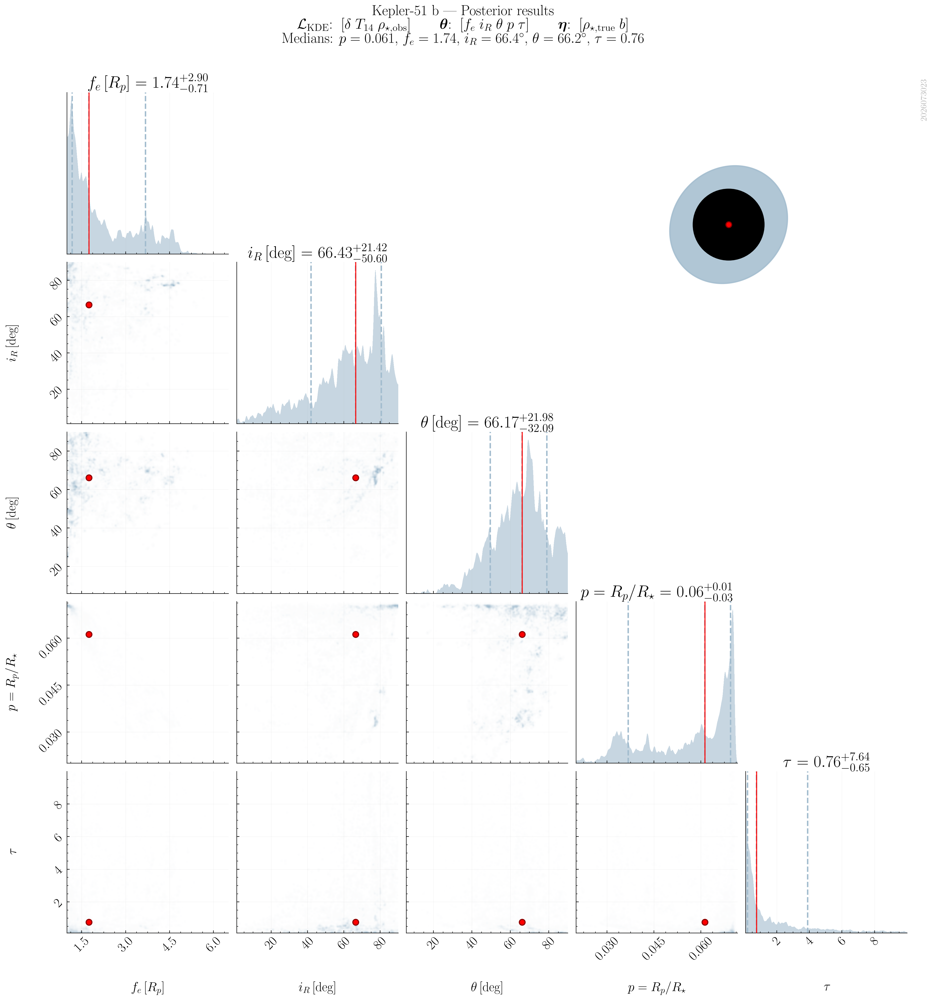

-> /Users/jzuluaga/dev/PRisma/papers/kepler51/figures/final_planetd_panel_reduced_density.png


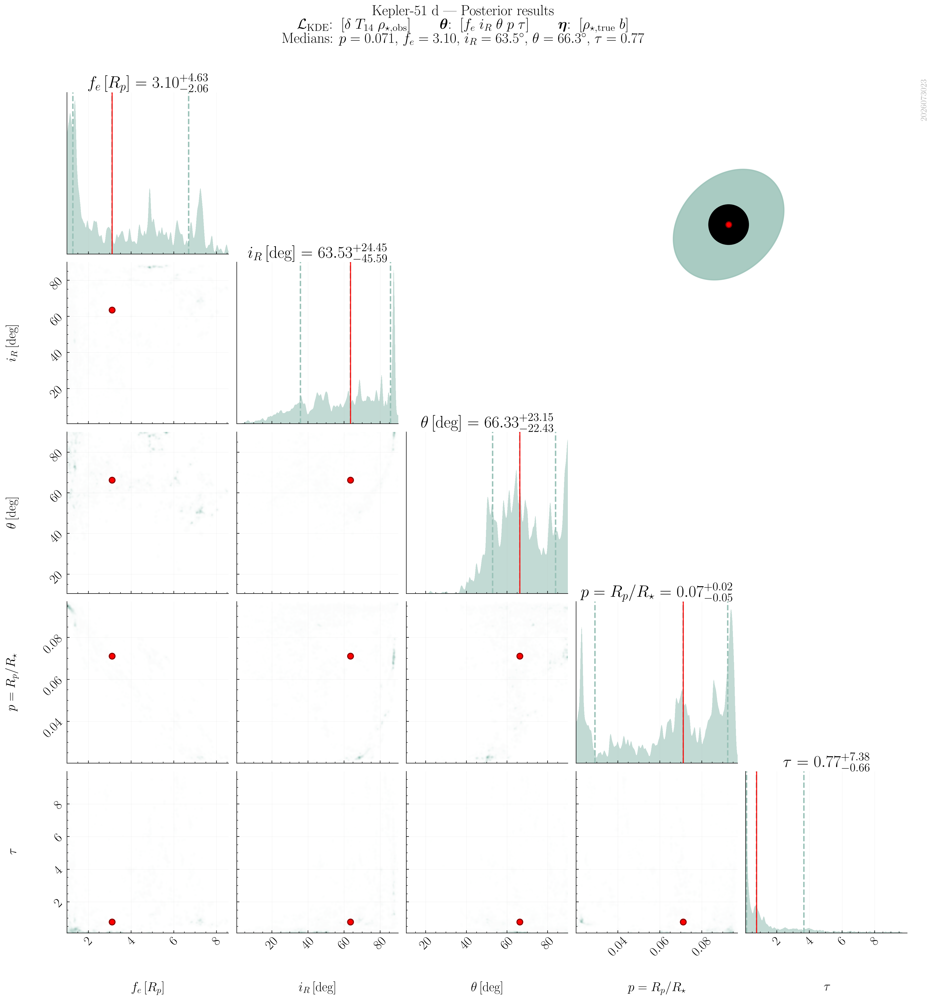

In [21]:
# Redraw reduced panels with oversampled draws + density colormap (or contours).
# Toggle PLOT_DENSITY / PLOT_CONTOURS / FILL_CONTOURS in the helpers cell.
# Outputs: final_planet{b,d}_panel_reduced_hires.png  (or _density if density-only)
_suffix = "density" if (PLOT_DENSITY and not PLOT_CONTOURS) else "hires"
for pl in PLANETS_HIRES:
    if pl not in runs:
        print(f"skip {pl}: not loaded")
        continue
    run_hi = make_hires_run(runs[pl], n_samples=N_OVERSAMPLE, seed=SEED)
    fig_hi = plot_results_panel_reduced_hires(run_hi)
    out_hi = IMG / f"final_planet{pl}_panel_reduced_{_suffix}.png"
    plot.add_run_version_label(fig_hi, RUN_VERSION)
    fig_hi.savefig(out_hi, bbox_inches="tight", dpi=plot.STYLE["fig_dpi"])
    print("->", out_hi)
    plt.show()


In [ ]:
# Optional: compare contour vs density on the f_e–p panel (same weighted samples).
COMPARE_PLANET = "b"
STYLES = [
    dict(label="filled contours\n(paper-like)", plot_density=False, plot_contours=True, fill_contours=True),
    dict(label="contour lines only", plot_density=False, plot_contours=True, fill_contours=False),
    dict(label="density color", plot_density=True, plot_contours=False, fill_contours=False),
    dict(label="density + lines", plot_density=True, plot_contours=True, fill_contours=False),
]

if COMPARE_PLANET in runs:
    run0 = runs[COMPARE_PLANET]
    fig, axs = plt.subplots(1, len(STYLES), figsize=(4.0 * len(STYLES), 4.0))
    pnames = run0["param_names"]
    i_fe, i_p = pnames.index("fe"), pnames.index("p")
    samples = np.asarray(run0["dres"].samples)
    w = np.exp(np.asarray(run0["dres"].logwt) - float(run0["dres"].logz[-1]))
    w = np.clip(w, 0, None); w /= w.sum()
    color = plot.planet_color(run0["planet"], "corner")
    for ax, st in zip(np.atleast_1d(axs), STYLES):
        dy_hist2d(
            samples[:, i_p], samples[:, i_fe], ax=ax,
            weights=w, smooth=CORNER_SMOOTH, color=color,
            plot_density=st["plot_density"],
            plot_contours=st["plot_contours"],
            fill_contours=st["fill_contours"],
        )
        ax.set_xlabel(plot.param_meta("p")["label"])
        ax.set_ylabel(plot.param_meta("fe")["label"])
        ax.set_title(st["label"], fontsize=11)
    fig.suptitle(
        f"Kepler-51{COMPARE_PLANET}: contours vs density color (same posterior)",
        y=1.02,
    )
    fig.tight_layout()
    out_cmp = IMG / f"final_planet{COMPARE_PLANET}_fe_p_style_scan.png"
    fig.savefig(out_cmp, bbox_inches="tight", dpi=plot.STYLE["fig_dpi"])
    print("->", out_cmp)
    plt.show()
